In [1]:
!pip install ultralytics
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 18.8 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 73.7MB/s]


In [2]:
import yaml

# Define correct values
correct_path = '/kaggle/input/military-object/military_object_dataset'
yaml_file_path = f'{correct_path}/military_dataset.yaml'

# Load original YAML
with open(yaml_file_path, 'r') as f:
    data = yaml.safe_load(f)

# Update the path
data['path'] = correct_path

# Update the class names to include class 9: trench
data['names'] = {
    0: 'camouflage_soldier',
    1: 'weapon',
    2: 'military_tank',
    3: 'military_truck',
    4: 'military_vehicle',
    5: 'civilian',
    6: 'soldier',
    7: 'civilian_vehicle',
    8: 'military_artillery',
    9: 'trench',
    10: 'military_aircraft',
    11: 'military_warship'
}

# Save corrected YAML to a writable location
output_yaml_path = '/kaggle/working/military_dataset_corrected.yaml'
with open(output_yaml_path, 'w') as f:
    yaml.dump(data, f)

# Display the corrected YAML file
print(f"✅ YAML file updated and saved to: {output_yaml_path}\n")
print("📄 Corrected YAML content:\n")

with open(output_yaml_path, 'r') as f:
    print(f.read())


✅ YAML file updated and saved to: /kaggle/working/military_dataset_corrected.yaml

📄 Corrected YAML content:

names:
  0: camouflage_soldier
  1: weapon
  2: military_tank
  3: military_truck
  4: military_vehicle
  5: civilian
  6: soldier
  7: civilian_vehicle
  8: military_artillery
  9: trench
  10: military_aircraft
  11: military_warship
path: /kaggle/input/military-object/military_object_dataset
test: test/images
train: train/images
val: val/images



In [3]:
import os, cv2, yaml, random, numpy as np
from PIL import Image
from glob import glob
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:

    def __init__(self, root, data_types, n_ims, rows, cmap=None):
        self.root = root
        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]

        self.get_cls_names()
        self.get_bboxes()

    def get_cls_names(self):
        with open(f"{self.root}/military_dataset.yaml", 'r') as file:
            data = yaml.safe_load(file)
        self.class_dict = {index: name for index, name in enumerate(data['names'])}

    def get_bboxes(self):
        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}

        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            im_paths = glob(f"{self.root}/{data_type}/images/*")
            
            for idx, im_path in enumerate(im_paths):
                bboxes = []
                im_ext = os.path.splitext(im_path)[-1]
                lbl_path = im_path.replace(im_ext, ".txt").replace(f"{data_type}/images/", f"{data_type}/labels/")
                if not os.path.isfile(lbl_path):
                    continue

                meta_data = open(lbl_path).readlines()
                for data in meta_data:
                    parts = data.strip().split()
                    cls_name, bbox = None, None

                    if len(parts) == 5:
                        cls_name = parts[0]
                        try:
                            bbox = [float(x) for x in parts[1:]]
                        except:
                            print(f"Skipping invalid float values: {data.strip()}")
                            continue
                    elif len(parts) == 4 and '.' in parts[0]:
                        # Try to recover from merged class name
                        merged = parts[0]
                        for i in range(len(merged)):
                            if merged[i].isdigit():
                                cls_name = merged[:i]
                                try:
                                    bbox = [float(merged[i:])] + [float(x) for x in parts[1:]]
                                except:
                                    print(f"Skipping invalid merged line: {data.strip()}")
                                    bbox = None
                                break
                    elif len(parts) > 5:
                        print(f"Skipping polygon-like line with {len(parts)} values: {data.strip()}")
                    else:
                        print(f"Skipping malformed line: {data.strip()}")

                    if cls_name is not None and bbox is not None:
                        bboxes.append([cls_name] + bbox)
                        cls_index = int(cls_name) if cls_name.isdigit() else cls_name
                        if cls_index not in all_analysis_datas:
                            all_analysis_datas[cls_index] = 1
                        else:
                            all_analysis_datas[cls_index] += 1

                all_bboxes.append(bboxes)

            self.vis_datas[data_type] = all_bboxes
            self.analysis_datas[data_type] = all_analysis_datas
            self.im_paths[data_type] = im_paths

    def plot(self, rows, cols, count, im_path, bboxes):
        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:
            if len(bbox) != 5:
                continue

            class_id, x_center, y_center, w, h = bbox

            try:
                x_center, y_center, w, h = float(x_center), float(y_center), float(w), float(h)
            except:
                continue

            x_min = int((x_center - w / 2) * width)
            y_min = int((y_center - h / 2) * height)
            x_max = int((x_center + w / 2) * width)
            y_max = int((y_center + h / 2) * height)

            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(or_im, (x_min, y_min), (x_max, y_max), color, thickness=3)

        plt.imshow(or_im)
        plt.axis("off")
        plt.title(f"There is (are) {len(bboxes)} object(s) in the image.")

        return count + 1

    def vis(self, save_name):
        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb": cmap = "viridis"
        cols = self.n_ims // self.rows
        count = 1

        indices = [random.randint(0, len(self.vis_datas[save_name]) - 1) for _ in range(self.n_ims)]

        plt.figure(figsize=(25, 20))

        for idx in indices:
            if count == self.n_ims + 1:
                break

            im_path = self.im_paths[save_name][idx]
            bboxes = self.vis_datas[save_name][idx]

            count = self.plot(self.rows, cols, count, im_path, bboxes)

        plt.show()

    def data_analysis(self, save_name, color):
        print("Data analysis is in process...\n")

        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys())
        counts = list(self.analysis_datas[save_name].values())

        _, ax = plt.subplots(figsize=(30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color=color)
        ax.set_xlabel("Class Names", color="black")
        ax.set(xticks=indices, xticklabels=cls_names)
        ax.set_ylabel("Data Counts", color="black")
        ax.set_title(f"{save_name.upper()} Dataset Class Imbalance Analysis")

        for i, v in enumerate(counts):
            ax.text(i - text_width, v + text_height, str(v), color="royalblue")

    def visualization(self):
        [self.vis(save_name) for save_name in self.data_types]

    def analysis(self):
        [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]

Skipping polygon-like line with 27 values: 8 0.682652096875 0.7169637546875001 0.6711956812500001 0.6743583609375 0.4681044015625 0.5928524078125 0.6076645796875 0.5113463828125 0.5982911203125 0.4557741125 0.3160462515625 0.48911746093749997 0.249390715625 0.4557741125 0.16919572968750002 0.48170786718749997 0.1681541734375 0.5261656421875001 0.4379010671875 0.5372801375 0.434635440625 0.9009259281249999 0.5972496421875 0.918876434375 0.682652096875 0.7169637546875001
Skipping polygon-like line with 41 values: 8 0.367079540625 0.8781233515625001 0.38686793750000004 0.8318131265625001 0.42019570625 0.78179806875 0.405614778125 0.7669788109375 0.37957743437499997 0.741045128125 0.3493741796875 0.7317830828125 0.2608472109375 0.7373402953125 0.211896878125 0.7132589921875 0.22960239843750002 0.702144496875 0.261888609375 0.6725059812499999 0.319170765625 0.6336053484375 0.3764529203125 0.5761808390625001 0.30771442968749996 0.62619575625 0.258764096875 0.6169337109375 0.20668940937500002

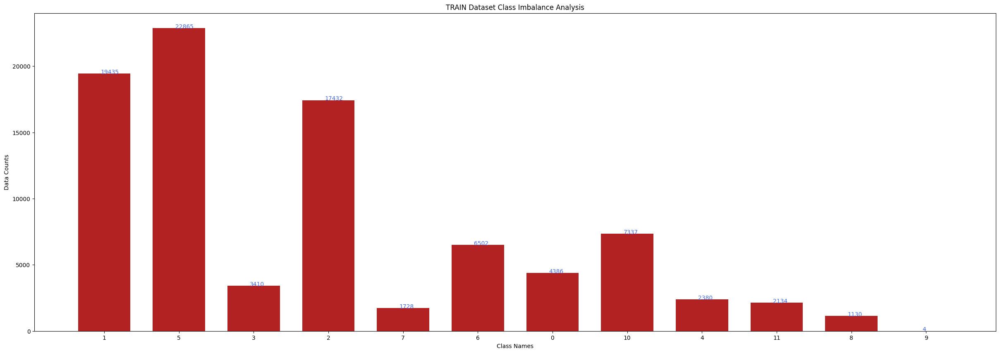

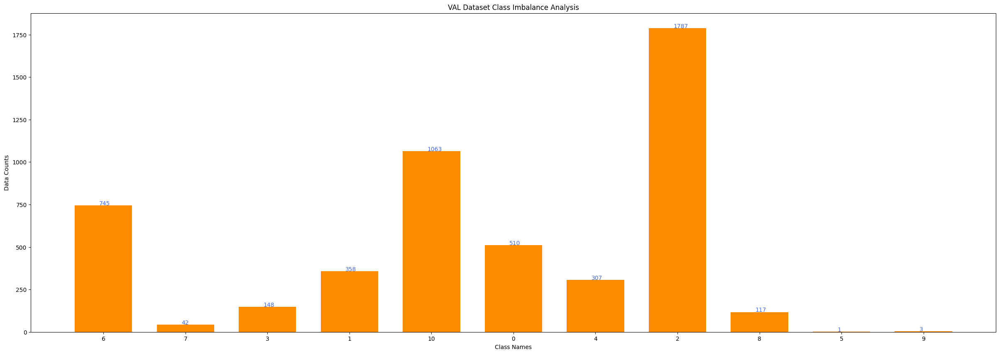

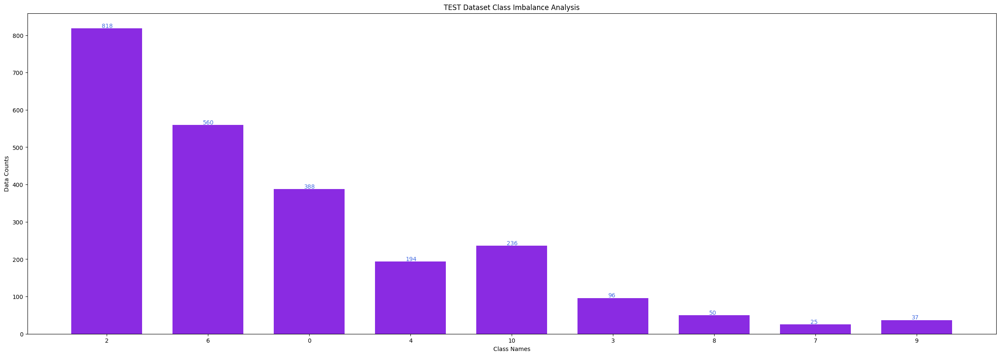

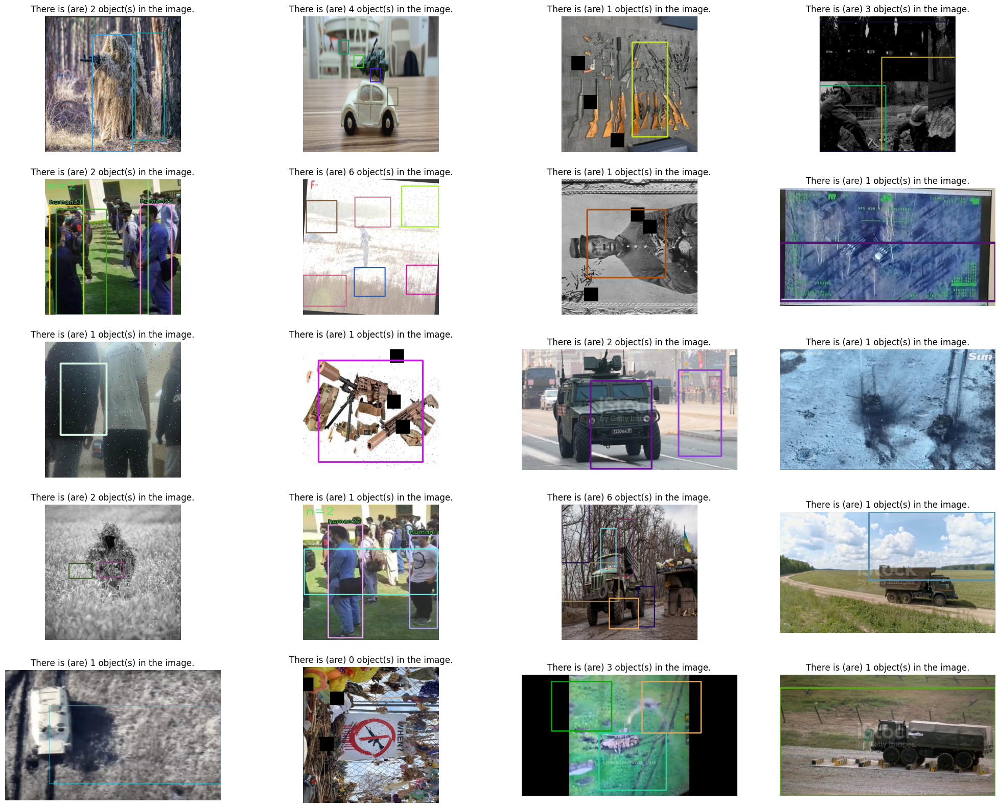

VAL Data Visualization is in process...



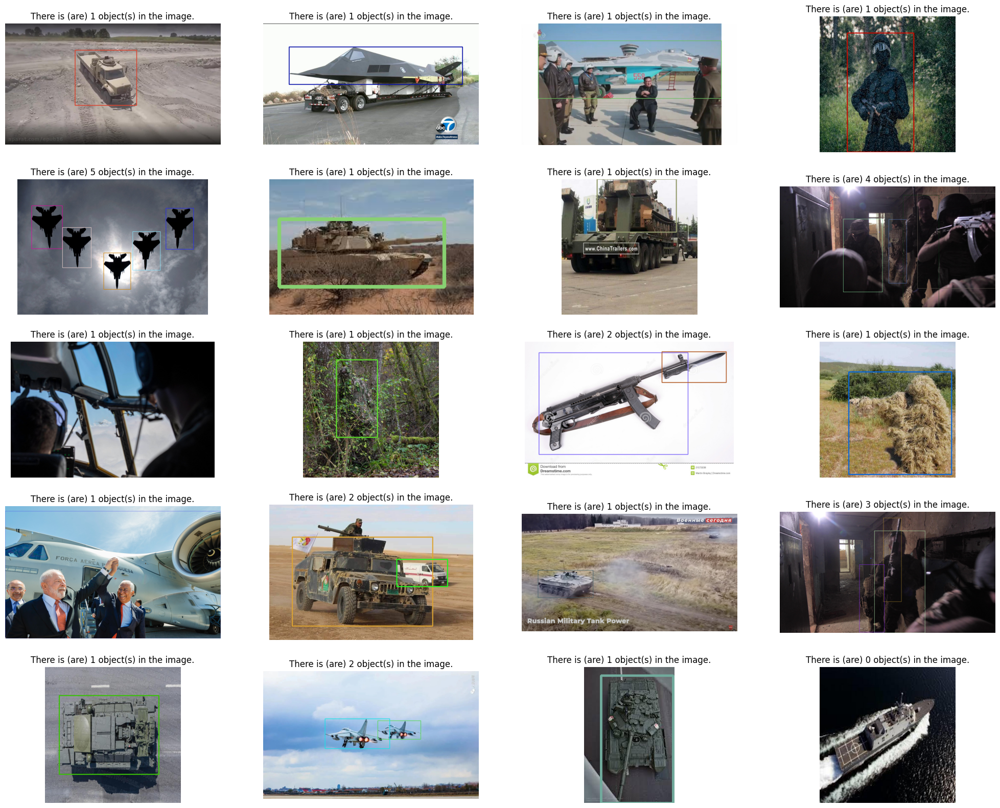

TEST Data Visualization is in process...



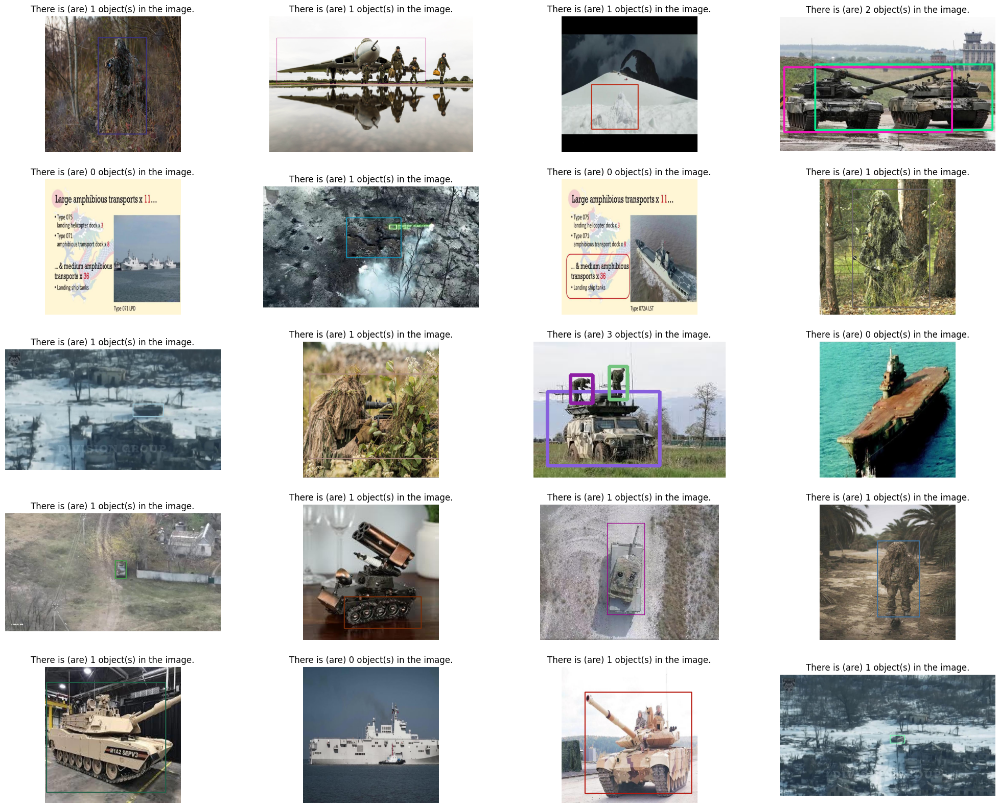

In [4]:
# Instantiate and run
root = "/kaggle/input/military-object/military_object_dataset"
vis = Visualization(root=root, data_types=["train", "val", "test"], n_ims=20, rows=5, cmap="rgb")
vis.analysis()
vis.visualization()

In [5]:
import torch
print("CUDA Available:", torch.cuda.is_available())
print("Device count:", torch.cuda.device_count())

# Load YAML content into a Python dictionary
yml_file_path = "/kaggle/working/military_dataset_corrected.yaml"

with open(yml_file_path, 'r') as file:
    data = yaml.safe_load(file)
# Update the paths
data['train'] = '/kaggle/input/military-object/military_object_dataset/train/images'
data['val'] = '/kaggle/input/military-object/military_object_dataset/val/images'
data['test'] = '/kaggle/input/military-object/military_object_dataset/test/images'

print(data)
# Save the updated YAML content to a file
output_path = '/kaggle/working/updated_config.yml'
with open(output_path, 'w') as file: yaml.dump(data, file, default_flow_style=False)

train_results = model.train(
    data="/kaggle/working/updated_config.yml",
    epochs=70,
    imgsz=640,              # Better for accuracy
    amp=True,
    workers=4,
    optimizer='Adam',
    lr0=0.001,
    patience=5,            # Increase to avoid early stop
    mosaic=0.5,
    degrees=5.0,
    translate=0.1,
    scale=0.5,
    shear=2.0,
    fliplr=0.5,
    copy_paste=0.1,
    cos_lr=True,
    cache=True,
    pretrained=True,
    single_cls=False,
    project='/kaggle/working/train_results',
    name='yolov11_finetune'
)

CUDA Available: True
Device count: 2
{'names': {0: 'camouflage_soldier', 1: 'weapon', 2: 'military_tank', 3: 'military_truck', 4: 'military_vehicle', 5: 'civilian', 6: 'soldier', 7: 'civilian_vehicle', 8: 'military_artillery', 9: 'trench', 10: 'military_aircraft', 11: 'military_warship'}, 'path': '/kaggle/input/military-object/military_object_dataset', 'test': '/kaggle/input/military-object/military_object_dataset/test/images', 'train': '/kaggle/input/military-object/military_object_dataset/train/images', 'val': '/kaggle/input/military-object/military_object_dataset/val/images'}
Ultralytics 8.3.145 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/updated_config.yml, degrees=5.0, deterministic=True, device

100%|██████████| 755k/755k [00:00<00:00, 17.0MB/s]


Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytic

train: Scanning /kaggle/input/military-object/military_object_dataset/train/labels... 44298 images, 1161 backgrounds, 1 corrupt: 100%|██████████| 44350/44350 [01:55<00:00, 385.05it/s]

train: /kaggle/input/military-object/military_object_dataset/train/images/gun_96_jpeg.rf.aeee6bf8f2d9165e73e8385a93ab2cc0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0916]


WARNING ⚠️ train: Cache directory /kaggle/input/military-object/military_object_dataset/train is not writeable, cache not saved.
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 480, len(boxes) = 89085. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
WARNING ⚠️ train: 66.7GB RAM required to cache images with 50% safety margin but only 29.0/31.4GB available, not caching images
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.2±0.3 ms, read: 39.0±32.4 MB/s, size: 378.7 KB)


val: Scanning /kaggle/input/military-object/military_object_dataset/val/labels... 2941 images, 273 backgrounds, 0 corrupt: 100%|██████████| 2941/2941 [00:08<00:00, 354.62it/s]


WARNING ⚠️ val: Cache directory /kaggle/input/military-object/military_object_dataset/val is not writeable, cache not saved.
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (2.6GB RAM): 100%|██████████| 2941/2941 [00:12<00:00, 241.95it/s]


Plotting labels to /kaggle/working/train_results/yolov11_finetune/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/train_results/yolov11_finetune
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/70      3.18G      1.331      2.006      1.549         24        640: 100%|██████████| 2772/2772 [08:56<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:17<00:00,  5.21it/s]


                   all       2941       5081      0.177      0.172      0.133     0.0675

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/70       3.2G      1.273      1.653      1.508         43        640: 100%|██████████| 2772/2772 [08:31<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.81it/s]


                   all       2941       5081      0.362      0.232      0.221      0.119

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/70      3.53G      1.238      1.521      1.481         31        640: 100%|██████████| 2772/2772 [08:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.89it/s]


                   all       2941       5081      0.265      0.318      0.266      0.144

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/70      3.53G      1.187      1.416      1.443         52        640: 100%|██████████| 2772/2772 [08:36<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.81it/s]


                   all       2941       5081      0.363      0.305      0.312      0.172

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/70      3.53G      1.154      1.338      1.419         39        640: 100%|██████████| 2772/2772 [08:30<00:00,  5.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.89it/s]


                   all       2941       5081      0.496      0.309       0.34      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/70      3.53G      1.125      1.271      1.397         45        640: 100%|██████████| 2772/2772 [08:32<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.77it/s]


                   all       2941       5081      0.414      0.369      0.372      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/70      3.53G       1.12      1.238      1.388         32        640: 100%|██████████| 2772/2772 [08:35<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.73it/s]


                   all       2941       5081      0.402      0.402      0.396      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/70      3.53G        1.1      1.205      1.375         34        640: 100%|██████████| 2772/2772 [08:31<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.80it/s]


                   all       2941       5081      0.476      0.412      0.426      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/70      3.53G      1.092      1.185      1.366         26        640: 100%|██████████| 2772/2772 [08:31<00:00,  5.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.94it/s]


                   all       2941       5081      0.467      0.422      0.432      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/70      3.53G      1.082      1.158       1.36         38        640: 100%|██████████| 2772/2772 [08:36<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.91it/s]


                   all       2941       5081      0.438       0.43      0.431      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/70      3.53G      1.074      1.141      1.352         29        640: 100%|██████████| 2772/2772 [08:37<00:00,  5.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.97it/s]


                   all       2941       5081      0.453      0.432      0.442       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/70      3.53G      1.067      1.125      1.348         46        640: 100%|██████████| 2772/2772 [08:32<00:00,  5.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.82it/s]


                   all       2941       5081      0.481      0.439      0.449      0.273

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/70      3.53G      1.064      1.115      1.344         32        640: 100%|██████████| 2772/2772 [08:39<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.90it/s]


                   all       2941       5081      0.468      0.442       0.45      0.277

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/70      3.53G      1.044      1.086      1.331         57        640: 100%|██████████| 2772/2772 [09:11<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.63it/s]


                   all       2941       5081      0.514      0.428      0.455      0.281

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/70      3.53G      1.039      1.079      1.326         43        640: 100%|██████████| 2772/2772 [08:58<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.58it/s]


                   all       2941       5081      0.509       0.43      0.459      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/70      3.53G      1.034      1.073      1.323         31        640: 100%|██████████| 2772/2772 [09:18<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.61it/s]


                   all       2941       5081      0.501      0.446      0.466      0.291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/70      3.53G      1.028      1.056       1.32         48        640: 100%|██████████| 2772/2772 [09:15<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.86it/s]


                   all       2941       5081      0.506      0.451      0.466      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/70      3.53G      1.024      1.041      1.315         28        640: 100%|██████████| 2772/2772 [09:05<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.70it/s]


                   all       2941       5081      0.503      0.447       0.47      0.295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/70      3.53G      1.019      1.035      1.311         53        640: 100%|██████████| 2772/2772 [09:01<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.72it/s]


                   all       2941       5081      0.507      0.449      0.472      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/70      3.53G      1.017      1.032      1.309         32        640: 100%|██████████| 2772/2772 [08:53<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.71it/s]


                   all       2941       5081      0.486      0.462      0.476      0.299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/70      3.53G      1.008      1.011        1.3         40        640: 100%|██████████| 2772/2772 [08:58<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.70it/s]


                   all       2941       5081      0.498       0.46      0.478      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/70      3.53G          1      1.004      1.295         26        640: 100%|██████████| 2772/2772 [08:45<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.98it/s]


                   all       2941       5081      0.504      0.461      0.479      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/70      3.53G     0.9943     0.9949      1.292         39        640: 100%|██████████| 2772/2772 [08:41<00:00,  5.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.78it/s]


                   all       2941       5081      0.528       0.45      0.479      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/70      3.53G     0.9964     0.9877      1.292         31        640: 100%|██████████| 2772/2772 [08:46<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.92it/s]


                   all       2941       5081      0.518      0.453      0.482      0.305

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/70      3.53G     0.9909     0.9811      1.289         33        640: 100%|██████████| 2772/2772 [08:50<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.65it/s]


                   all       2941       5081      0.518      0.455      0.482      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/70      3.53G     0.9803     0.9657      1.281         55        640: 100%|██████████| 2772/2772 [08:54<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.95it/s]


                   all       2941       5081      0.513      0.458      0.484      0.307

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/70      3.53G     0.9808     0.9629      1.279         32        640: 100%|██████████| 2772/2772 [09:00<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.78it/s]


                   all       2941       5081      0.522      0.454      0.486      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/70      3.53G      0.974     0.9481      1.274         44        640: 100%|██████████| 2772/2772 [08:50<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.80it/s]


                   all       2941       5081      0.523      0.456      0.486      0.309

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/70      3.53G     0.9708     0.9444      1.272         37        640: 100%|██████████| 2772/2772 [08:51<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.80it/s]


                   all       2941       5081      0.523      0.458      0.488      0.311

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/70      3.53G     0.9668     0.9382      1.269         41        640: 100%|██████████| 2772/2772 [09:05<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.71it/s]


                   all       2941       5081      0.523       0.46      0.489      0.312

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/70      3.53G     0.9558     0.9222      1.264         28        640: 100%|██████████| 2772/2772 [09:00<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.76it/s]


                   all       2941       5081      0.525       0.46      0.491      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/70      3.53G     0.9607     0.9181      1.264         45        640: 100%|██████████| 2772/2772 [09:07<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.66it/s]


                   all       2941       5081      0.515      0.465      0.492      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/70      3.53G     0.9487     0.9096      1.257         23        640: 100%|██████████| 2772/2772 [08:59<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.81it/s]


                   all       2941       5081      0.517      0.466      0.494      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/70      3.53G     0.9471     0.9019      1.254         34        640: 100%|██████████| 2772/2772 [09:06<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.80it/s]


                   all       2941       5081       0.52      0.466      0.496      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/70      3.53G     0.9427     0.8902      1.249         48        640: 100%|██████████| 2772/2772 [09:02<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.86it/s]


                   all       2941       5081      0.523      0.468      0.496      0.317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/70      3.53G     0.9352     0.8776      1.245         40        640: 100%|██████████| 2772/2772 [08:45<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.71it/s]


                   all       2941       5081      0.523      0.468      0.498      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/70      3.53G       0.93     0.8709       1.24         46        640: 100%|██████████| 2772/2772 [08:52<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.59it/s]


                   all       2941       5081      0.527      0.469      0.499      0.319

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/70      3.53G     0.9263     0.8619      1.238         41        640: 100%|██████████| 2772/2772 [08:45<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.89it/s]


                   all       2941       5081       0.53      0.469      0.501      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/70      3.53G     0.9209     0.8529      1.232         25        640: 100%|██████████| 2772/2772 [09:11<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.84it/s]


                   all       2941       5081       0.53       0.47      0.502      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/70      3.53G     0.9218     0.8554      1.233         31        640: 100%|██████████| 2772/2772 [09:02<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.60it/s]


                   all       2941       5081      0.533       0.47      0.503      0.322

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/70      3.53G     0.9119     0.8417      1.226         42        640: 100%|██████████| 2772/2772 [09:06<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.79it/s]


                   all       2941       5081      0.531      0.473      0.504      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/70      3.53G     0.9083     0.8348      1.222         47        640: 100%|██████████| 2772/2772 [09:00<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.87it/s]


                   all       2941       5081       0.53      0.481      0.505      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/70      3.53G     0.9029     0.8259      1.222         24        640: 100%|██████████| 2772/2772 [08:51<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.55it/s]


                   all       2941       5081      0.529      0.479      0.506      0.325

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/70      3.53G      0.898     0.8101      1.216         41        640: 100%|██████████| 2772/2772 [08:39<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.81it/s]


                   all       2941       5081      0.532       0.48      0.508      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/70      3.53G     0.8969     0.8087      1.216         42        640: 100%|██████████| 2772/2772 [08:46<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.85it/s]


                   all       2941       5081      0.556      0.467       0.51      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/70      3.53G     0.8907     0.7991      1.211         49        640: 100%|██████████| 2772/2772 [08:34<00:00,  5.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.96it/s]


                   all       2941       5081      0.559      0.463      0.511      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/70      3.53G     0.8878     0.7894      1.208         27        640: 100%|██████████| 2772/2772 [08:38<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:18<00:00,  5.03it/s]


                   all       2941       5081      0.562      0.462      0.513      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/70      3.53G     0.8778     0.7802      1.203         27        640: 100%|██████████| 2772/2772 [08:53<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.86it/s]


                   all       2941       5081      0.564      0.462      0.515      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/70      3.53G     0.8787     0.7778      1.201         38        640: 100%|██████████| 2772/2772 [08:54<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.68it/s]


                   all       2941       5081      0.569      0.463      0.517      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/70      3.53G     0.8672     0.7707      1.195         43        640: 100%|██████████| 2772/2772 [09:00<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.73it/s]


                   all       2941       5081      0.541      0.476      0.518      0.335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/70      3.53G     0.8634     0.7596      1.193         38        640: 100%|██████████| 2772/2772 [08:44<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.93it/s]


                   all       2941       5081       0.56      0.469      0.521      0.336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/70      3.53G     0.8576     0.7449      1.187         57        640: 100%|██████████| 2772/2772 [08:49<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.91it/s]


                   all       2941       5081      0.556       0.47      0.523      0.337

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/70      3.53G     0.8532     0.7422      1.185         46        640: 100%|██████████| 2772/2772 [09:13<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:17<00:00,  5.33it/s]


                   all       2941       5081      0.552      0.474      0.524      0.338

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/70      3.53G     0.8514     0.7355      1.182         63        640: 100%|██████████| 2772/2772 [09:47<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:23<00:00,  3.96it/s]


                   all       2941       5081      0.549      0.481      0.525      0.338

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/70      3.53G     0.8472     0.7298       1.18         19        640: 100%|██████████| 2772/2772 [10:53<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:19<00:00,  4.61it/s]


                   all       2941       5081      0.548      0.481      0.524       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/70      3.53G     0.8396     0.7214      1.176         45        640: 100%|██████████| 2772/2772 [10:49<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:17<00:00,  5.12it/s]


                   all       2941       5081      0.541      0.489      0.526      0.341

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/70      3.53G     0.8428     0.7233      1.176         43        640: 100%|██████████| 2772/2772 [10:57<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:19<00:00,  4.63it/s]


                   all       2941       5081      0.546      0.487      0.527      0.342

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/70      3.53G     0.8325     0.7083       1.17         30        640: 100%|██████████| 2772/2772 [10:43<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:17<00:00,  5.32it/s]


                   all       2941       5081      0.554      0.485      0.529      0.344

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/70      3.53G     0.8296     0.7052      1.169         31        640: 100%|██████████| 2772/2772 [09:12<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.95it/s]


                   all       2941       5081      0.554      0.486      0.531      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/70      3.53G     0.8223     0.6984      1.163         31        640: 100%|██████████| 2772/2772 [08:26<00:00,  5.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.98it/s]


                   all       2941       5081      0.551      0.491      0.531      0.346
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/70      3.53G     0.7863     0.5923      1.148         21        640: 100%|██████████| 2772/2772 [08:23<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.89it/s]


                   all       2941       5081      0.546      0.498      0.534      0.347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/70      3.53G     0.7836     0.5814      1.145         25        640: 100%|██████████| 2772/2772 [08:35<00:00,  5.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.91it/s]


                   all       2941       5081      0.564      0.487      0.537      0.348

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/70      3.53G      0.778     0.5781      1.141         24        640: 100%|██████████| 2772/2772 [08:47<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:17<00:00,  5.33it/s]


                   all       2941       5081      0.564      0.487      0.536      0.349

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/70      3.53G     0.7733     0.5725       1.14         34        640: 100%|██████████| 2772/2772 [08:38<00:00,  5.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.87it/s]


                   all       2941       5081      0.567      0.483      0.537       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/70      3.53G     0.7708     0.5693      1.137         23        640: 100%|██████████| 2772/2772 [08:25<00:00,  5.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.93it/s]


                   all       2941       5081      0.568      0.483      0.536      0.351

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/70      3.53G     0.7697     0.5661      1.137         26        640: 100%|██████████| 2772/2772 [08:16<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.92it/s]


                   all       2941       5081       0.57      0.481      0.536      0.352

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/70      3.53G     0.7677     0.5636      1.135         25        640: 100%|██████████| 2772/2772 [08:16<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  6.03it/s]


                   all       2941       5081      0.574      0.483      0.537      0.353

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/70      3.53G     0.7649     0.5602      1.133         22        640: 100%|██████████| 2772/2772 [08:11<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.46it/s]


                   all       2941       5081      0.576      0.485      0.539      0.354

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/70      3.53G     0.7637     0.5607      1.131         21        640: 100%|██████████| 2772/2772 [08:09<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  6.00it/s]


                   all       2941       5081      0.577      0.487       0.54      0.355

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/70      3.53G     0.7618      0.559      1.132         30        640: 100%|██████████| 2772/2772 [08:22<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:15<00:00,  5.95it/s]


                   all       2941       5081       0.58      0.487      0.542      0.355

70 epochs completed in 10.727 hours.
Optimizer stripped from /kaggle/working/train_results/yolov11_finetune/weights/last.pt, 5.5MB
Optimizer stripped from /kaggle/working/train_results/yolov11_finetune/weights/best.pt, 5.5MB

Validating /kaggle/working/train_results/yolov11_finetune/weights/best.pt...
Ultralytics 8.3.145 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,584,492 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:16<00:00,  5.45it/s]


                   all       2941       5081      0.579      0.487      0.542      0.355
    camouflage_soldier        385        510       0.79      0.741      0.798      0.444
                weapon        222        358      0.709      0.542      0.581      0.421
         military_tank        938       1787      0.777      0.871      0.859      0.577
        military_truck         84        148      0.462      0.649      0.615      0.373
      military_vehicle        149        307      0.684      0.453      0.563       0.42
              civilian          1          1          0          0          0          0
               soldier        420        745       0.78      0.648      0.726      0.423
      civilian_vehicle         18         42      0.638      0.378      0.484      0.294
    military_artillery         85        117      0.672      0.265      0.453      0.299
                trench          1          3          0          0          0          0
     military_aircraf

In [6]:
Image.open(f"/train_results/yolov11_finetune/confusion_matrix.png")


FileNotFoundError: [Errno 2] No such file or directory: '/train_results/yolov11_finetune/confusion_matrix.png'

In [ ]:
Image.open(f"runs/detect/train5/results.png")

In [ ]:
Image.open(f"runs/detect/train5/P_curve.png")

In [ ]:
Image.open(f"runs/detect/train5/PR_curve.png")

In [ ]:
Image.open(f"runs/detect/train5/val_batch0_pred.jpg")

In [ ]:
inference_results = model("/kaggle/input/military-object/military_object_dataset/test/images", device = 0, verbose = False)

In [ ]:
def inference_vis(res, n_ims, rows):
    cols = n_ims // rows
    plt.figure(figsize = (20, 10))
    for idx, r in enumerate(res):
        if idx == n_ims: break
        plt.subplot(rows, cols, idx + 1)
        or_im_rgb = np.array(Image.open(r.path).convert("RGB"))
        if idx == n_ims: break    
        for i in r:
            for bbox in i.boxes:
                box = bbox.xyxy[0]
                x1, y1, x2, y2 = box
                coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
                cv2.rectangle(or_im_rgb, coord1, coord2, color=(255,0,0), thickness=2)
        plt.imshow(or_im_rgb)
        plt.title(f"Image#{idx + 1}")
        plt.axis("off")
inference_vis(res = inference_results, n_ims = 15, rows = 3)